# BERTopic Topic Modeling with LLAMA-2
* Notebook by Adam Lang
* Date: 10/3/2024

# Overview
* This is a notebook that goes through how to use LLAMA-2 for topic modeling with BERTopic.
* Full credit for the techniques and concepts goes to Maarten Grootendorst the creator of BERTopic.

# Introduction
* This was sourced from Maarten's original blog post and is a great introduction to the "why" of this technique.
* The standard workflow for BERTopic is:
1. Embedding your documents
2. Reducing the dimensionality of embeddings
  * e.g. UMAP
3. Cluster reduced embeddings
  * e.g. HDBSCAN
4. Tokenize documents per cluster
5. Extract best-representing words per cluster
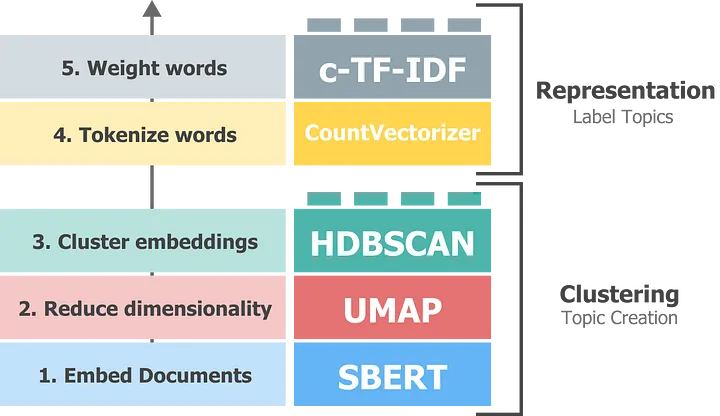

* However, using LLMS like LLAMA-2, Maarten the creator of BERTopic emphasizes that taking advantage of an open source LLMs advanced capabilities can only help to improve the overall topic modeling process as we see below from his original blog post:
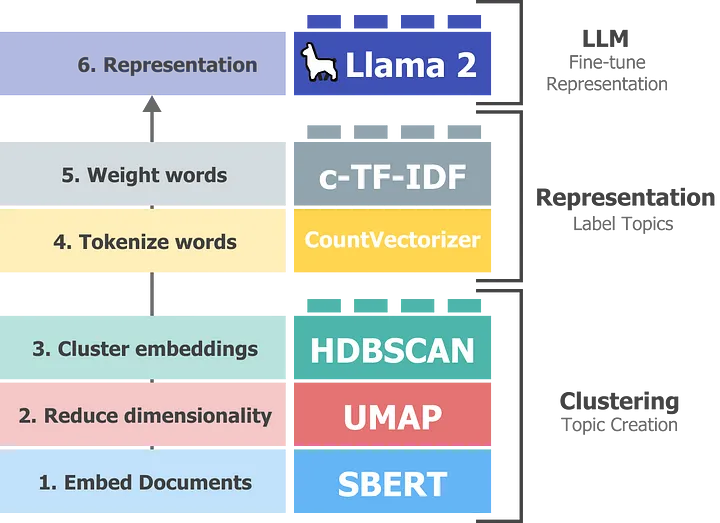

# Reasoning for using LLMs
* While BERTopic and other related models are great for easy analysis and extraction of topics, they often are "not interpretable" and require more human interaction.
* What Maarten means by this is lets say an output topic is: **"car-car-store"**
  * We can assume this topic is about cars and going to the store but it is very OPEN to interpretation.
  * **This is where an LLM like LLAMA-2 can help us make a more interpretable topic name with keywords to better represent the underlying clusters.**

# Dependencies
* These are the dependencies:
1. **bertopic**
  * for topic modeling
2. **datasets**
  * huggingface datasets library
3. **accelerate**
  * huggingface library for speeding up and optimizing run-time for LLMs and transformers
4. **bitsandbytes**
  * for quantization of embeddings and LLMs
5. **xformers**
  * aims to improve the efficiency and memory usage of Transformers, making it possible to train larger models and handle longer sequences of data.
6. **adjustText**
  * library to help you adjust text positions on matplotlib plots to remove or minimize overlaps with each other and data points

In [ ]:
%%capture
!pip install bertopic datasets accelerate bitsandbytes xformers adjustText

# Data
* We are going to use a dataset from huggingface suggested by Maarten.
* It consists of ArXiv abstracts from research papers which often have variable language and terms which is great for topic modeling.

In [ ]:
## import datasets from hf
from datasets import load_dataset

## load dataset -- train set
dataset = load_dataset('CShorten/ML-ArXiv-Papers')['train']

## extract the abstracts to train model on and the titles
abstracts = dataset['abstract']
titles = dataset['title']

In [ ]:
## printing abstract for "attention is all you need"
print(abstracts[13894])

In [4]:
## how many abstracts in dataset?
len(dataset)

117592

# HuggingFace Credentials
* Need to apply for LLAMA2 access.
* Need huggingface token.

In [4]:
## hf hub login
from huggingface_hub import notebook_login
notebook_login()

# Llama-2
* This is the model we are using: https://huggingface.co/meta-llama/Llama-2-13b-chat-hf
* Why would you want to use the 13B model?
  * Maarten says this is a "nice balance between inference and speed, accuracy and speed."
  * A larger model would be more accurate but compute power would be an issue.
  * A smaller model would be faster but less accurate.
  * Thus we go with the "in-between" size.

In [5]:
## import torch
import torch

## model_id
model_id = 'meta-llama/Llama-2-13b-chat-hf'

## device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

cuda


# LLM Optimization & Quantization
* Before loading a 13 BILLION PARAMETER LLM, optimization is a must!
* VRAM on any device is limited, so we need to condense the model to run it locally.
* There are numerous techniques and tricks to do this but the main principle is **4-bit quantization.**
* This will reduce the **64-bit representation** to only **4-bits** which reduces the GPU memory needed to run the LLM model.
* More info here:
  * QLoRA paper: https://arxiv.org/pdf/2305.14314
  * HF blog: https://huggingface.co/blog/4bit-transformers-bitsandbytes

In [6]:
from torch import bfloat16
import transformers

## set quantization configuration to load LLM with less GPU memory
## requires `bitsandbytes` library

##bits and bytes config -- 32 bit to 4 bit
bnb_config = transformers.BitsAndBytesConfig(
    load_in_4bit=True, #4-bit quantization
    bnb_4bit_quant_type='nf4', #normalized float 4
    bnb_4bit_use_double_quant=True, #second quantization after first
    bnb_4bit_compute_dtype=bfloat16 #computation type

)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

4 Parameters that we use (source: Maarten's blog post):
1. load_in_4bit - Allows us to load the model in 4-bit precision compared to the original 32-bit precision. This gives us an incredible speed up and reduces memory!
2. bnb_4bit_quant_type - This is the type of 4-bit precision. The paper recommends normalized float 4-bit, so that is what we are going to use!
3. bnb_4bit_use_double_quant - This is a neat trick as it performs a second quantization after the first which further reduces the necessary bits
4. bnb_4bit_compute_dtype - The compute type used during computation, which further speeds up the model.


# Load LLM Model from hf

In [7]:
## llama 2 tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained(model_id)

## llama 2 model instantiate
model = transformers.AutoModelForCausalLM.from_pretrained(
    model_id,
    trust_remote_code=True,
    quantization_config=bnb_config, #quantization config from above
    device_map='auto'
)

## model params
model.eval()

tokenizer_config.json:   0%|          | 0.00/1.62k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/587 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/33.4k [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/9.95G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/9.90G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/6.18G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/188 [00:00<?, ?B/s]

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 5120)
    (layers): ModuleList(
      (0-39): 40 x LlamaDecoderLayer(
        (self_attn): LlamaSdpaAttention(
          (q_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (k_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (v_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (o_proj): Linear4bit(in_features=5120, out_features=5120, bias=False)
          (rotary_emb): LlamaRotaryEmbedding()
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear4bit(in_features=5120, out_features=13824, bias=False)
          (up_proj): Linear4bit(in_features=5120, out_features=13824, bias=False)
          (down_proj): Linear4bit(in_features=13824, out_features=5120, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((5120,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((5120,), eps=

# Pipeline Setup
* Here we will setup a huggingface transformers pipeline for the LLM model.
* The task we want is **text-generation**
* Penalty discourages repetitive or redundant output.
  * It is designed to address the tendency of language models to produce repeated phrases, sentences, or patterns.
  * In topic modeling we generally DO NOT want repetitive outputs.
* Temperature lower --> more deterministic!!

* More about pipeline params: https://medium.com/@developer.yasir.pk/understanding-the-controllable-parameters-to-run-inference-your-large-language-model-30643bb46434

In [8]:
## text generator pipeline
generator = transformers.pipeline(
    model=model,
    tokenizer=tokenizer,
    task='text-generation',
    temperature=0.1,
    max_new_tokens=500,
    repetition_penalty=1.1
)

# Prompt Engineering
* These are some basic prompts to "take the model for a test drive."

In [9]:
## test prompt
prompt = "Could you explain to me how 4-bit quantization words as if I was 6 years old?"
res = generator(prompt)
print(res[0]['generated_text'])

Could you explain to me how 4-bit quantization words as if I was 6 years old?

I'm not sure what 4-bit quantization means, but I'll do my best to explain it in a way that a 6-year-old could understand!

So, you know how we can see lots of different colors in the world around us, like blue sky, green grass, and red apples? Well, computers can also see colors, but instead of using our eyes to see them, they use something called "bits" to represent the colors.

A bit is like a tiny piece of information that the computer can understand. It's either a 0 or a 1, kind of like a yes or no answer. And just like how we can use different words to describe the same thing, like "red" or "blue", computers can use different numbers of bits to represent the same color.

Now, when we talk about 4-bit quantization, we're talking about using four of these tiny pieces of information (or bits) to represent one color. So, instead of seeing a whole range of colors like we do with our eyes, the computer is on

## Prompt Templates for Llama-2
* The prompt templates for meta-llama-2 chat are here: https://www.llama.com/docs/model-cards-and-prompt-formats/meta-llama-2/
* The main prompt format is as follows:

1. The `{{ System Prompt }}` helps us guide the model during a conversation.
  * YOU ALWAYS START WITH THIS.
  * For example, we can say that it is a helpful assistant that is specialized in labeling topics.
2. The `{{ User Prompt }}` is where we ask it a question
3. The `[INST]` tags show us the beginning and end of a prompt.

Below is the actual prompt template recommended for meta-llama.

In [10]:
"""


<s>[INST] <<SYS>>


{{ System Prompt }}


<</SYS>>


{{ User Prompt }}[/INST]


{{ Model Answer }}
"""

'\n\n\n<s>[INST] <<SYS>>\n\n\n{{ System Prompt }}\n\n\n<</SYS>>\n\n\n{{ User Prompt }}[/INST]\n\n\n{{ Model Answer }}\n'

### 1. System Prompt
* This is the first prompt needed.

In [11]:
# System prompt describes information given to all conversations
system_prompt = """
<s>[INST] <<SYS>>
You are a helpful, respectful and honest assistant for labeling topics.
<</SYS>>
"""

## Prompt Template we will use for topic modeling
* This is the recommended format for TOPIC MODELING by Maarten.
* It has 2 components:
1. **example**
  * Most LLMs will do much better generating accurate responses if you give them examples to work from.
  * Therefore we need to show an example of what we want our output to be.
2. **main prompt**



### 2. example_prompt
* This is the 2nd prompt needed.

In [12]:
# Example prompt demonstrating the output we are looking for
example_prompt = """
I have a topic that contains the following documents:
- Traditional diets in most cultures were primarily plant-based with a little meat on top, but with the rise of industrial style meat production and factory farming, meat has become a staple food.
- Meat, but especially beef, is the word food in terms of emissions.
- Eating meat doesn't make you a bad person, not eating meat doesn't make you a good one.

The topic is described by the following keywords: 'meat, beef, eat, eating, emissions, steak, food, health, processed, chicken'.

Based on the information about the topic above, please create a short label of this topic. Make sure you to only return the label and nothing more.
[/INST] Environmental impacts of eating meat
"""

Summary:
* Give the example documents or text.
* Give example keywords.
* End by stating "please create a short label of this topic"

### 3. main_prompt
* This is the 3rd prompt needed.

In [13]:
# Our main prompt with documents ([DOCUMENTS]) and keywords ([KEYWORDS]) tags
main_prompt = """
[INST]
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the information about the topic above, please create a short label of this topic. Make sure you to only return the label and nothing more.
[/INST]
"""

* The main_prompt has spaces for us to insert what DOCUMENTS and KEYWORDS we want to use which will change as we perform TOPIC MODELING.
* There are two BERTopic-specific tags that are of interest, namely `[DOCUMENTS]` and `[KEYWORDS]`:

1. `[DOCUMENTS]` contain the top 5 most relevant documents to the topic
2. `[KEYWORDS]` contain the top 10 most relevant keywords to the topic as generated through c-TF-IDF algorithm from BERTopic.
  * This template will be completed according to each topic.
  


And finally, we can combine this into our final prompt:

In [14]:
## FINAL PROMPT format
prompt = system_prompt + example_prompt + main_prompt

# BERTopic and Topic Modeling
* Now that the LLM is setup we can get into Topic Modeling.

## 1. Prepare Embeddings
* Pre-calculation of embeddings for each document to speed-up additional exploration steps and use the embeddings to quickly iterate over BERTopic's hyperparameters as needed.
* You can use ANY embedding model that you want to, here we will use a SentenceTransformer model.

In [15]:
!pip install sentence-transformers

In [16]:
## load SentenceTransformers
from sentence_transformers import SentenceTransformer

## pre-calculate embeddings
embedding_model = SentenceTransformer('BAAI/bge-small-en')

## create embeddings using the abstracts which are our documents
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/90.8k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/684 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/366 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/3675 [00:00<?, ?it/s]

## 2. Sub-models
* Next step is to define a few sub-models in BERTopic.
* Then we can do some small tweaks to the number of clusters to be created, setting random_states and more.
* **NOTE: A technique I am NOT using here but is worth trying is hyperparameter tuning using bayesian optimization which would help us choose more refined parameters.**

In [17]:
from umap import UMAP ## dimensionality reduction
from hdbscan import HDBSCAN ## density based clustering algorithm

## create umap model
umap_model = UMAP(n_neighbors=15,
                  n_components=5,
                  min_dist=0.0,
                  metric='cosine',
                  random_state=42)

## create hdbscan model
hdbscan_model = HDBSCAN(min_cluster_size=150, ## increase this --> FEWER TOPICS
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=True)

We will also reduce the embeddings just created to 2 dimensions so we can use them for visualization purposes after creating topics.

In [18]:
## pre-reduce embeddings for visualization
reduced_embeddings = UMAP(n_neighbors=15,
                          n_components=2,
                          min_dist=0.0,
                          metric='cosine',
                          random_state=42).fit_transform(embeddings)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


## 3. Representation Models
* One of the ways we are going to represent the topics is with the LLM Llama 2.
  * This should give us a nice set of quality labels for the topics.
* However, we might want to have additional representations to view a topic from MULTIPLE angles.
* Below we will use the `c-TF-IDF` from **BERTopic** as the main representation, and `KeyBERT`, `MMR`, and `Llama2` as the additional representations.

In [19]:
## import representation models from BERTopic
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration

## 1. KeyBERT
keybert = KeyBERTInspired()

## 2. MMR
mmr = MaximalMarginalRelevance(diversity=0.3) ## higher value --> more diversity keywords

## 3. Text Generation with Llama 2 LLM
llama2 = TextGeneration(generator, prompt=prompt)

### ALL Representation models combined
representation_model = {
    "KeyBERT": keybert,
    "Llama2": llama2,
    "MMR": mmr,
}

# Topic Model Training
* Now that ALL models are prepared, we can start training the TOPIC MODEL.
* BERTopic is what we are using.
* We will do the following:
1. Give "sub-models" to BERTopic.
2. Run `.fit_transform`
3. Evaluate Topic outputs

In [20]:
## import BERTopic
from bertopic import BERTopic
from tqdm import tqdm

## setup topic model
topic_model = BERTopic(

  # sub-models - 4 models
  embedding_model=embedding_model, #1
  umap_model=umap_model, #2
  hdbscan_model=hdbscan_model, #3
  representation_model=representation_model, #4

  # hyperparameters
  top_n_words=10,
  verbose=True,
)

# Train topic model
topics, probs = tqdm(topic_model.fit_transform(abstracts, embeddings))

2024-10-04 16:41:43,340 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-10-04 16:44:29,750 - BERTopic - Dimensionality - Completed ✓
2024-10-04 16:44:29,756 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-10-04 16:44:53,427 - BERTopic - Cluster - Completed ✓
2024-10-04 16:44:53,503 - BERTopic - Representation - Extracting topics from clusters using representation models.
100%|██████████| 120/120 [37:21<00:00, 18.68s/it]
2024-10-04 17:22:51,948 - BERTopic - Representation - Completed ✓
100%|██████████| 2/2 [00:00<00:00, 20164.92it/s]


# Topic Model Results Evaluation
* Lets evaluate the results and outputs.

In [21]:
## get topic info -- pandas DF
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,Llama2,MMR,Representative_Docs
0,-1,32398,-1_the_of_and_to,"[the, of, and, to, in, we, for, is, that, on]","[models, model, datasets, algorithms, learning...","[Machine Learning and Deep Learning, , , , , ,...","[of, data, as, learning, our, model, models, f...",[ Zero-shot learning (ZSL) can be defined by ...
1,0,10400,0_policy_reinforcement_rl_agent,"[policy, reinforcement, rl, agent, learning, c...","[dynamics, robots, reinforcement, learning, mo...","[Reinforcement Learning and Agent Control, , ,...","[policy, reinforcement, rl, learning, control,...",[Bridging model-based safety and model-free re...
2,1,3482,1_speech_audio_speaker_music,"[speech, audio, speaker, music, asr, acoustic,...","[encoder, voice, neural, speech, models, langu...","[Speech and Audio Processing Technologies, , ,...","[audio, asr, acoustic, recognition, voice, we,...",[ In order to build language technologies for...
3,2,2338,2_equations_differential_physics_neural,"[equations, differential, physics, neural, dyn...","[modeling, pdes, dynamics, computational, simu...",[Approximate Solutions of Partial Differential...,"[equations, physics, dynamical, dynamics, pdes...",[ Physics-Informed Neural Networks (PINNs) ar...
4,3,2180,3_adversarial_attacks_robustness_attack,"[adversarial, attacks, robustness, attack, exa...","[adversarial, adversarially, dnns, dnn, imagen...",[Adversarial Attacks and Defenses in Deep Lear...,"[adversarial, attacks, robustness, examples, p...",[Deep Neural Networks (DNNs) have recently ach...
...,...,...,...,...,...,...,...,...
115,114,163,114_sentiment_aspect_analysis_polarity,"[sentiment, aspect, analysis, polarity, review...","[embeddings, sentiment, sentiments, annotated,...",[Natural Language Processing and Sentiment Ana...,"[sentiment, polarity, classification, twitter,...",[ This paper describes our deep learning-base...
116,115,162,115_view_views_multi_clustering,"[view, views, multi, clustering, subspace, mul...","[multiview, clustering, datasets, subspace, re...","[Multi-View Clustering, , , , , , , , , ]","[views, clustering, subspace, data, matrix, le...",[ With recent advances in data collection fro...
117,116,161,116_summarization_summaries_summary_abstractive,"[summarization, summaries, summary, abstractiv...","[summarization, summarisation, summarizing, su...","[Text Summarization Models and Techniques, , ,...","[summarization, summaries, summary, rouge, ext...",[ Abstractive Text Summarization is the proce...
118,117,160,117_cancer_gene_genes_omics,"[cancer, gene, genes, omics, cell, disease, da...","[omics, genomic, biomarkers, genes, methylatio...","[Cancer Genomics and Multi-Omics Analysis, , ,...","[cancer, genes, omics, genomic, sequencing, cl...",[ With the increasingly available large-scale...


## Deep Dive into 1 of the topics

In [27]:
## pick 1 topic to look closely at
topic_model.get_topic(0, full=True)['KeyBERT']

[('dynamics', 0.84989965),
 ('robots', 0.846009),
 ('reinforcement', 0.83981204),
 ('learning', 0.8387231),
 ('model', 0.8383199),
 ('robotic', 0.834996),
 ('robot', 0.83157754),
 ('optimal', 0.8233252),
 ('behavior', 0.8229992),
 ('markov', 0.82178515)]

In [28]:
## pick 1 topic to look closely at
topic_model.get_topic(0, full=True)['MMR']

[('policy', 0.015166297051245795),
 ('reinforcement', 0.01351079939436268),
 ('rl', 0.01173547746905103),
 ('learning', 0.009805502301441154),
 ('control', 0.008530007319179439),
 ('agents', 0.008478209581659405),
 ('reward', 0.007739755036938323),
 ('robot', 0.006487253921737312),
 ('environments', 0.0063300991831284235),
 ('action', 0.00624261831901569)]

In [29]:
## pick 1 topic to look closely at
topic_model.get_topic(0, full=True)['Llama2']

[('Reinforcement Learning and Agent Control', 1),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0)]

Summary:
* This is VERY interesting. What we can see above is that Llama2 was able to create a more interpretable output label for the topic than the keywords by KeyBERT or the keywords by MMR.
* This also makes the information easier to communicate to Stakeholders rather than the obscure words that often end up with Topic Modeling alone.

In [33]:
## another example
topic_model.get_topic(3, full=True)['Llama2']

[('Adversarial Attacks and Defenses in Deep Learning', 1),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0),
 ('', 0)]

The results we can see were over 100 topics that were created and all were VERY DIVERSE.

We can now use the labels that Llama2 lLM created and assign them to TOPICs that we created.

Usually, the default topic representation would be via the `c-TF-IDF` algorithm from BERTopic, but here we are going to instead focus on what the LLM Llama-2 gave us.

# Assign Topic Labels using Llama2 LLM

In [34]:
## generate topic labels using llama2 LLM
llama2_labels = [label[0][0].split("\n")[0] for label in topic_model.get_topics(full=True)["Llama2"].values()]

## Tag topic labels to topic_model dataframe
topic_model.set_topic_labels(llama2_labels)

# Visualize Topics

In [37]:
## topics
topic_model.visualize_documents(titles,
                                reduced_embeddings=reduced_embeddings,
                                hide_annotations=True,
                                hide_document_hover=False,
                                custom_labels=True)

# Summary
* Overall we can see a more interpretable way to model topics using an LLM like Llama2.